# 2.6 Основные способы визуализации

Графики играют основополагающую роль в детальном анализе временных рядов. Вы наверняка захотите изобразить данные ряда вдоль временной оси — предпочтительно таким образом, чтобы получить исчерпывающую информацию о наборе данных, такую как поведение исследуемой переменной или общее временное распределение точек данных.

Мы ранее рассматривали отдельные методы графического представления данных, знакомые каждому аналитику, например, в виде графика временной зависимости изучаемых величин или диаграммы рассеяния значений столбцов во времени. Рассмотрим способы визуализации, которые хорошо показали себя при исследовании поведения временных рядов.

Принципы визуализации разного уровня сложности.
* Одномерная визуализация предназначается для ознакомления с общим временным распределением наборов данных, из которых извлекаются анализируемые временные ряды.
* Двумерная визуализация (гистограмма) позволяет отследить временные изменения исследуемых величин при проведении большого количества параллельных измерений (проведение одинаковых измерений в течение многих лет или повторного многократного сбора данных одной и той же величины).
* Трехмерная визуализация, в которой время может представлять сразу два или даже ни одного измерения, но все равно (неявно) принимать участие в анализе данных.


2.6.1 Одномерная визуализация

В случае проведения измерений для множества изучаемых участников (пользователей, членов организации и т.д.) несколько временных рядов рассматриваются параллельно. Всегда неплохо сопоставить их в графическом виде, заключив данные отдельных участников в соответствующие временные рамки. На этом этапе объектом исследования выступают не отдельные временные точки, а временные диапазоны. Предметом анализа становятся временные интервалы.

Несмотря на широкий выбор инструментов, мы будем проводить анализ с помощью пакета timevis языка R. Нам предстоит изучить подмножество данных о добровольных взносах, подготовленное ранее donations. csv.

In [1]:
install.packages("data.table")
install.packages("timevis")
library(data.table)
library(timevis)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [2]:
#Код работает в RGui

require(timevis)
donations <- fread ("https://drive.google.com/uc?id=1OZslBsFVQ1OJSlwi2f61fFBZA12NkOuL")
d <- donations[, .(min(timestamp),max(timestamp)),member]
names(d) = c("content", "start", "end")

d <- d[start != end]

timevis(d[sample (1:nrow (d), 20)]
)

HTML widgets cannot be represented in plain text (need html)

![](https://drive.google.com/uc?id=108wHl4sLzr_e6GoFCvEAXk-yLJJ62qY0)

*Puc. 2.18. Диаграмма Гантта случайной выборки данных позволяет узнать о периодах “занятости” членов организации/плательщиков взносов*

Полученная диаграмма показывает, что членов благотворительной организации можно охарактеризовать так называемыми периодами “занятости”. Кроме того, из нее можно получить представление о суммах благотворительных взносов, вносимых плательщиком на протяжении всего времени членства в организации.

Диаграммы Гантта активно используются в течение последнего столетия, — чаще всего при решении задач управления проектами. Они начали применяться независимо сразу во многих отраслях, а их общая идея становится понятной уже при знакомстве с представленной на них информацией. Несмотря на то что исходно диаграммы Гантта были предназначены для управления проектами, их можно эффективно использовать в анализе временных рядов, представляющих данные многих независимых участников (в противоположность одному измеряемому процессу). Полученная диаграмма однозначно отвечает на вопрос о перекрытии платежей отдельных пользователей в течение всей истории внесения добровольных пожертвований. Получить представление о распределении взносов по одним табличным данным необычайно сложно.


2.6.2 Двумерная визуализация

Теперь давайте обратимся к данным пакета AirPassengers, чтобы исследовать их сезонные и трендовые изменения, отказавшись от представления о линейности течения времени. В частности, будем отображать время сразу на нескольких осях. Конечно, существует общая ось времени со всем нам привычным укладом смены часов, дней и годов, но ничто не запрещает выделить отдельную временную ось только для дней недели или времени суток. В такой способ мы акцентируем внимание на поведении данных в строго заданные временные интервалы — дни недели или месяцы года. Реализуемый подход позволяет предельно точно отслеживать сезонные изменения, что очень сложно сделать в ходе анализа данных в линейном, хронологическом масштабе времени.

Следующий код извлекает данные из объекта AirPassengers и представляет их в виде матрицы.

In [3]:
#R
t(matrix(AirPassengers, nrow = 12, ncol = 12))

112,118,132,129,121,135,148,148,136,119,104,118
115,126,141,135,125,149,170,170,158,133,114,140
145,150,178,163,172,178,199,199,184,162,146,166
171,180,193,181,183,218,230,242,209,191,172,194
196,196,236,235,229,243,264,272,237,211,180,201
204,188,235,227,234,264,302,293,259,229,203,229
242,233,267,269,270,315,364,347,312,274,237,278
284,277,317,313,318,374,413,405,355,306,271,306
315,301,356,348,355,422,465,467,404,347,305,336
340,318,362,348,363,435,491,505,404,359,310,337
360,342,406,396,420,472,548,559,463,407,362,405


Заметьте, что в процессе преобразования данные представляются в формате, принятом в объекте ts (time series).

***Столбцовая и строчная организация данных***

По умолчанию данные в языке R имеют столбцовую организацию (https://perma.cc/L4BH-DKB8) в противоположность строчному способу хранения данных, принятому в пакете NumPy языка Python (и в большинстве реляционных баз данных). Знать способ хранения данных, принятый по умолчанию в используемом языке программирования, важно не только для правильной их визуализации, но и для эффективного управления памятью, а также для получения быстрого доступа к любым хранящимся в ней данным.

Данные годов откладываются на отдельных осях, каждая из которых отражает помесячные изменения исследуемой величины в течение рассматриваемого года.

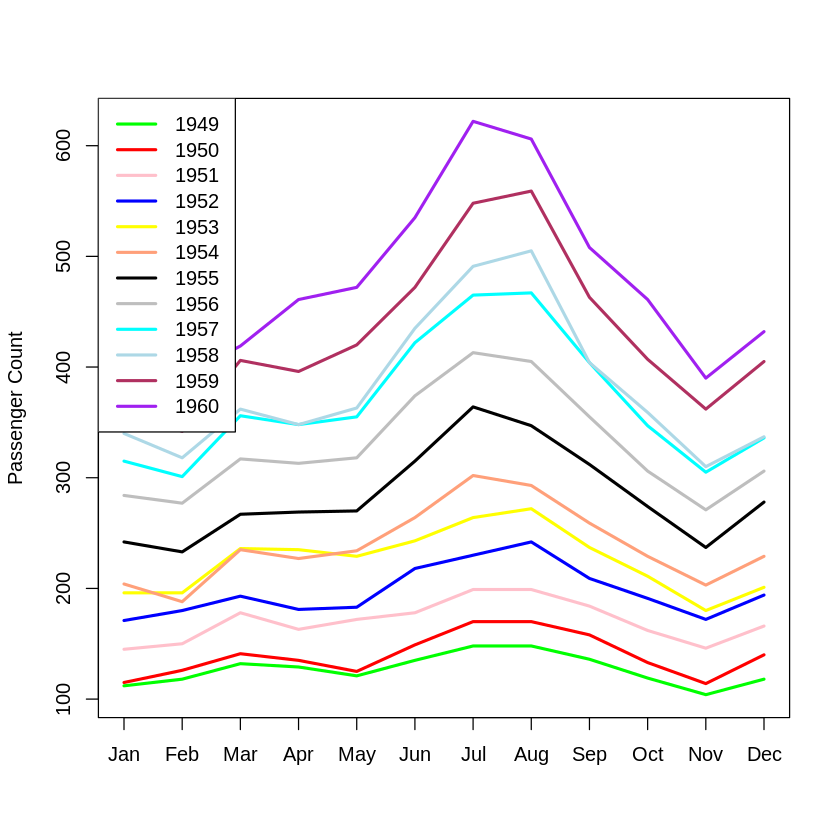

In [4]:
# R
colors = c("green", "red", "pink", "blue", "yellow", "lightsalmon", "black", "gray", "cyan", "lightblue", "maroon", "purple")
matplot(matrix(AirPassengers, nrow = 12, ncol = 12), type = 'l', col = colors, lty = 1, lwd = 2.5, xaxt = "n", ylab = "Passenger Count")
legend("topleft", legend = 1949:1960, lty = 1, lwd = 2.5, col = colors)
axis(1, at = 1:12, labels = c("Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"))

*Pиc. 2.19. Помесячный учет для каждого года*

Более простой способ построения такого же графика заключается в использовании пакета forecast

In [5]:
install.packages("forecast")

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



also installing the dependencies ‘xts’, ‘TTR’, ‘quadprog’, ‘quantmod’, ‘colorspace’, ‘fracdiff’, ‘lmtest’, ‘timeDate’, ‘tseries’, ‘urca’, ‘RcppArmadillo’




Loading required package: forecast

Registered S3 method overwritten by 'quantmod':
  method            from
  as.zoo.data.frame zoo 



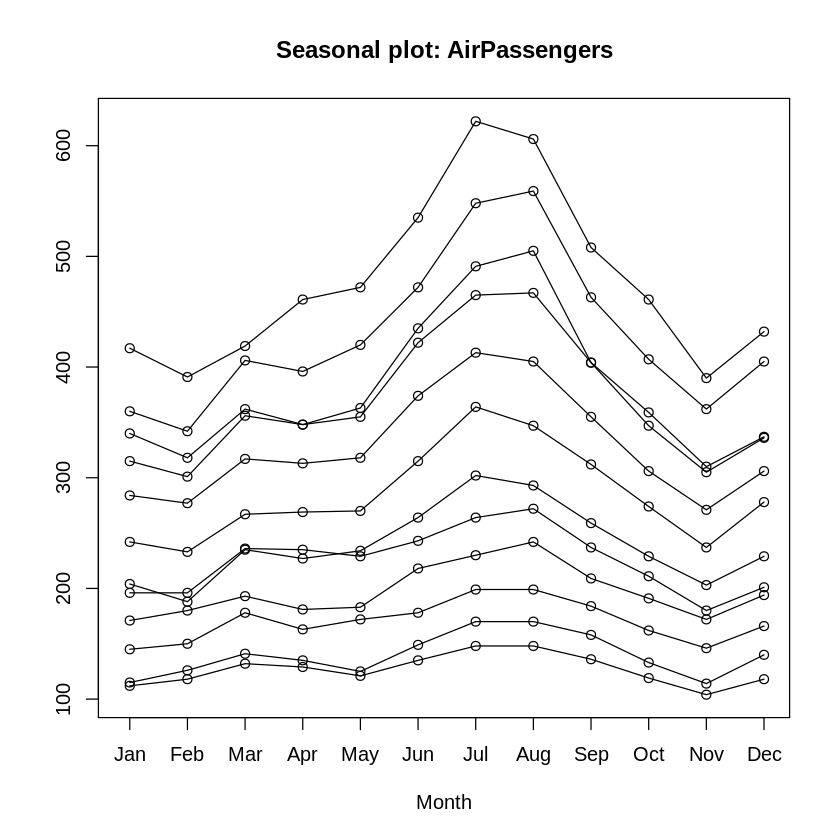

In [6]:
require(forecast)
seasonplot(AirPassengers)

*Pиc. 2.20. Результат построения предыдущего графика с помощью функции seasonplot()*

На оси х откладываются месяцы всех подлежащих анализу годов. В каждом году максимальное количество перевозимых авиакомпанией пассажиров регистрируется в июле или августе (7- и 8-й месяцы). Кроме того, в марте (3-й месяц) почти каждого года наблюдается локальный пик пассажирских перевозок. Таким образом, из графика можно узнать много важных сведений о сезонном характере пассажирских авиаперевозок.

Кривые разных лет редко пересекаются. Наблюдается настолько устойчивый рост, что в разные годы количество пассажиров, перевозимых в одном и том же месяце, редко бывает одинаковым. В общей тенденции есть несколько исключений, но такие наблюдения случаются не в пиковые месяцы. На основании одних только этих результатов можно составить прогноз по росту объемов пассажирских перевозок авиакомпании.

Альтернативный график годовых изменений отдельно для каждого месяца не менее стандартен, хотя и не столь информативен.

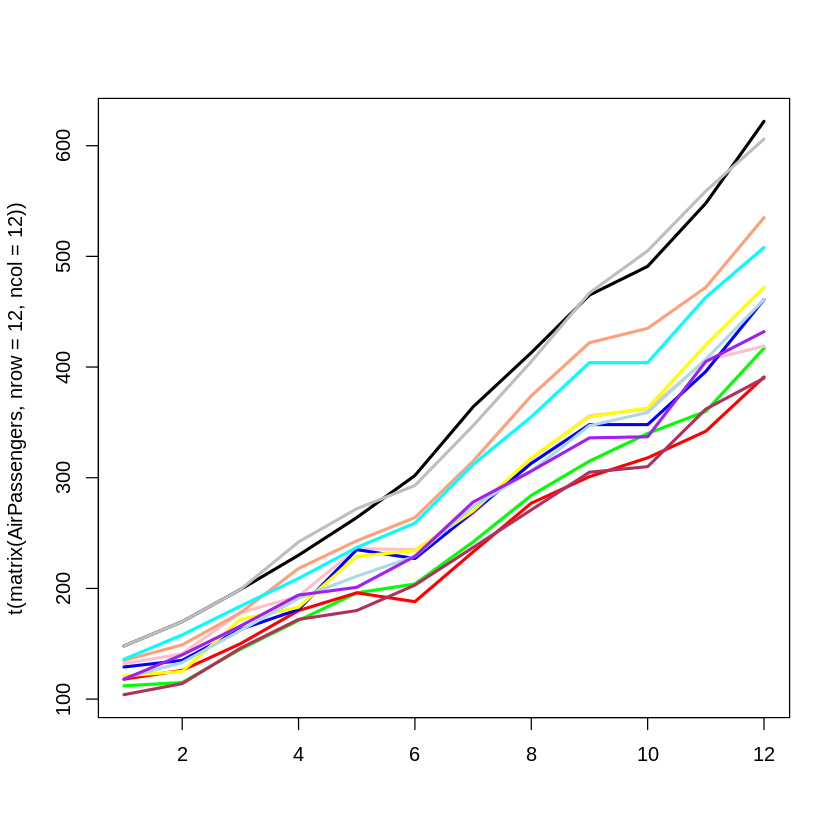

In [7]:
months = c("Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec")
matplot(t(matrix(AirPassengers, nrow = 12, ncol = 12)), type = 'l', col = colors, lty = 1, lwd = 2.5)

*Рис. 2.21. Годовые изменения для каждого месяца*

С увеличением значения года наблюдается тенденция к росту объемов пассажирских перевозок; иначе говоря, увеличивается скорость роста. Наибольший рост наблюдается в течение двух месяцев — июля и августа. Аналогичные выводы можно сделать, представив данные в графическом виде с помощью простой функции визуализации, включенной в состав пакета прогнозирования forecast.

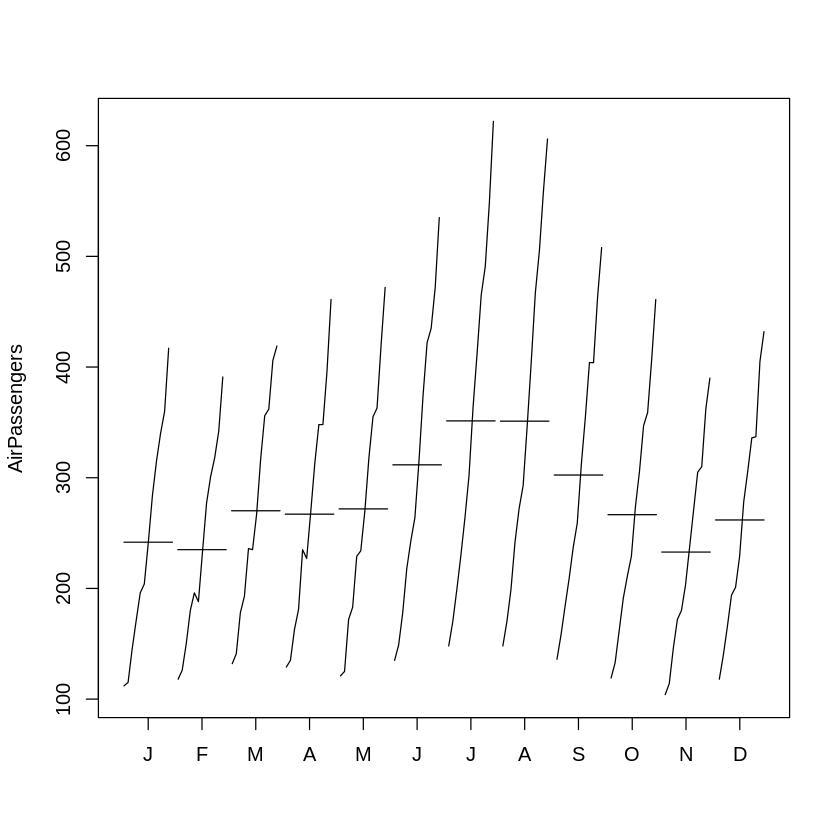

In [8]:
monthplot(AirPassengers)

*Рис. 3.22. Используем функцию monthplot() для помесячного изучения годовых объемов пассажирских перевозок*

Из двух последних графиков можно сделать два очевидных вывода:
* При построении графиков данных временных рядов можно использовать сразу несколько временных осей. В одном из случаев отдельные временные оси представляют помесячную разбивку для каждого года (с января по декабрь), а в другом наборы данных для каждого года отображаются на единой временной оси (с первого по последний/двенадцатый год);
* Изучая результаты визуализации данных временных рядов, можно получить намного больше полезных сведений и составить более точные прогнозы, чем в ходе анализа линейных графиков.

Рассмотрим правильно построенную двумерную гистограмму. В контексте анализа временных рядов на одной из осей двумерной гистограммы откладывается время (или величина, его заменяющая), а вторая ее ось отводится для отображения изучаемой величины. Набор временных графиков, отображенных вместе на одном из предыдущих рисунков, близок к тому, чтобы быть двумерной гистограммой, — для полного соответствия в них следует внести определенные изменения:
* Данные должны суммироваться как по времени, так и по количеству пассажиров;
* Нужно отобразить как можно больше данных. Двумерная гистограмма малоинформативная, если не отображает данные сразу всех кривых — будучи отображенными по отдельности, они не несут важных сведений. Только в случае представления полного набора данных двумерная гистограмма становится важным источником информации.

Проиллюстрируем возможности двумерных гистограмм на небольшом наборе данных, а затем перейдем к анализу более содержательного примера. Напишем пользовательскую функцию построения двумерной гистограммы «с нуля».

In [9]:
hist2d <- function(data, nbins.y, xlabels) {
  ## Создание равномерных интервалов на оси y, включающих
  ## минимальные и максимальные значения
  ymin <- min(data)
  ymax <- max(data) * 1.0001
  ## Ленивый способ вычислений, не требующий учета
  ## включаемых/исключаемых точек
  ybins <- seq(from = ymin, to = ymax, length.out = nbins.y + 1)
  ## Создание нулевой матрицы подходящего размера
  hist.matrix <- matrix(0, nrow = nbins.y, ncol = ncol(data))
  ## Данные представляются в виде матрицы, в которой каждая строка
  ## соответствует отдельной точке данных
  for (i in 1:nrow(data)) {
    ts <- findInterval(data[i, ], ybins)
    for (j in 1:ncol(data)) {
      hist.matrix[ts[j], j] <- hist.matrix[ts[j], j] + 1
    }
  }
  hist.matrix
}

Построим гистограмму в формате тепловой карты.

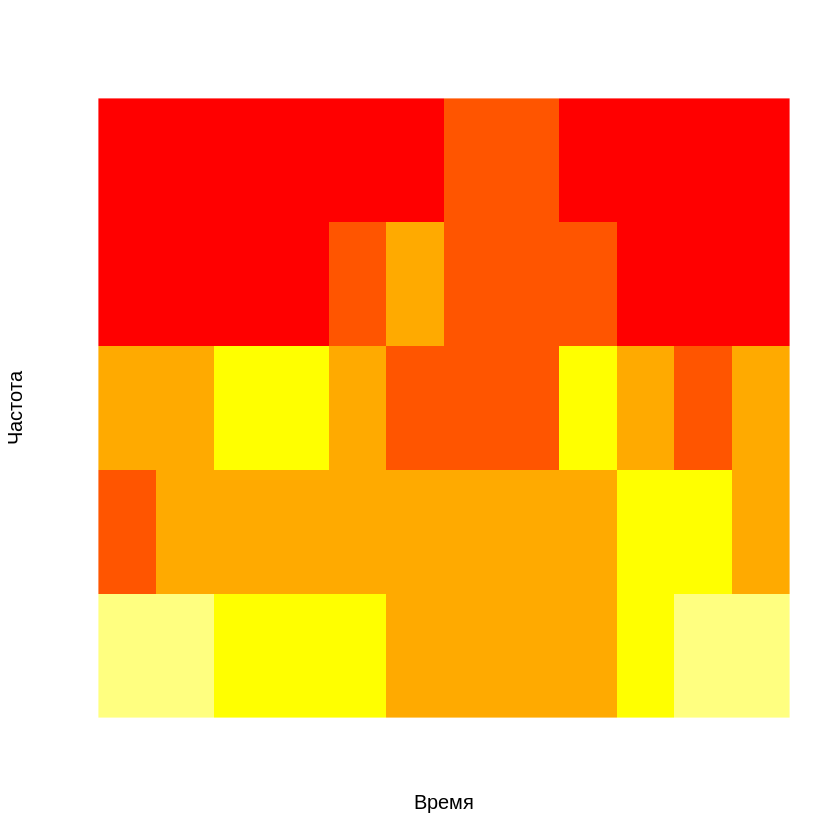

In [10]:
h <- hist2d(t(matrix(AirPassengers, nrow = 12, ncol = 12)), 5, months)
image(1:ncol(h), 1:nrow(h), t(h), col = heat.colors(5),
      axes = FALSE, xlab = "Время", ylab = "Частота")

*Рис. 2.23. Тепловая карта, построенная по двумерной гистограмме, для данных набора Air Passenger*

Полученная диаграмма не очень удобна для анализа.

Эта диаграмма не информативна, потому что в ней не хватает данных. На ней представлены данные всего 12 кривых, разделенных на 5 сегментов. Однако более важной проблемой является не стационарность данных. Наряду с этим гистограмма имеет смысл только в случае отображения стационарных данных. В нашем случае в данных просматривается тренд, который будет мешать распознаванию сезонных изменений.

Рассмотрим набор данных, включающий большее количество выборок и не “испорченный” трендом. Воспользуемся подмножеством набора данных FiftyWords, заимствованного из архива UCR Time Series Classification (https: //perma. cc/Y982-9FPS). Этот набор данных включает представление 50 разных слов, записанных в виде одномерных временных рядов, каждый из которых имеет одинаковую длину. Подмножество данных, используемых для построения полученного далее графика, взято из набора, который применялся при рассмотрении общих вопросов классификации временных рядов (https://oreil.ly/M6T-u). Для самостоятельного выполнения этого упражнения вы можете скачать это подмножество по указанной ссылке.

In [11]:
install.packages("data.table")  # Убедитесь, что пакет установлен
library(data.table)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [12]:
#words <- fread("/content/drive/MyDrive/TS&MO2/2/data/50words_TEST.csv", sep = ",", header = FALSE)
words <- fread ("https://drive.google.com/uc?id=1_q-BIYk7gNVP3SkJ8X1Iuhz67PHl-Xqs", sep = ",", header = FALSE)

In [13]:
setnames(words, paste0("V", 1:ncol(words)))

In [14]:
install.packages("gplots")
library(gplots)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependencies ‘bitops’, ‘gtools’, ‘caTools’



---------------------
gplots 3.3.0 loaded:
  * Use citation('gplots') for citation info.
  * Homepage: https://talgalili.github.io/gplots/
  * Report issues: https://github.com/talgalili/gplots/issues
  * Ask questions: https://stackoverflow.com/questions/tagged/gplots
  * Suppress this message with: suppressPackageStartupMessages(library(gplots))
---------------------



Attaching package: ‘gplots’


The following object is masked _by_ ‘.GlobalEnv’:

    hist2d


The following object is masked from ‘package:stats’:

    lowess




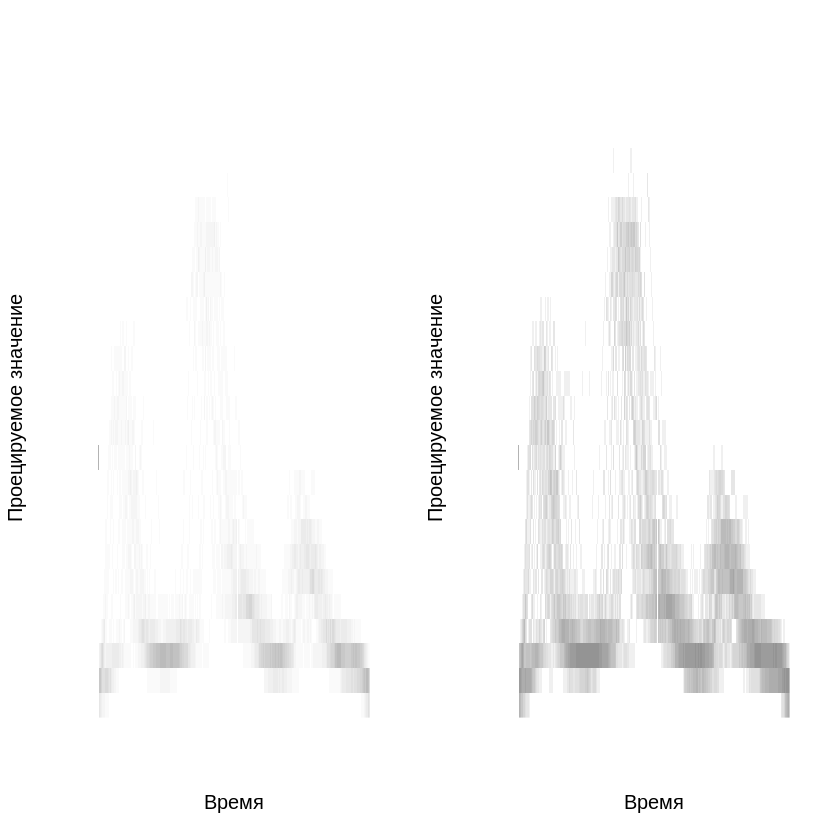

In [15]:
wl = words[V1 == 1]

h = hist2d(wl, 25, 1:ncol(wl))

colors = gray.colors(20, start = 1, end = .5)
par(mfrow = c(1, 2))

image(1:ncol(h), 1:nrow(h), t(h), col = colors, axes = FALSE, xlab = 'Время', ylab = 'Проецируемое значение')
image(1:ncol(h), 1:nrow(h), t(log(h)), col = colors, axes = FALSE, xlab = 'Время', ylab = 'Проецируемое значение')


*Рис. 2.24. Двумерная гистограмма проецирования звуков отдельного слова. В левой части график имеет линейную шкалу измерений, а в правой построен по логарифмической шкале*

Наш способ визуализации данных заметно отличается от принятого в готовых решениях, поэтому давайте изучим их более внимательно. Чтобы воспользоваться преимуществами готовых решений, необходимо предварительно изменить формат представления исходного набора данных, поскольку они предполагают отображение на гистограмме пар значений х - у. В отличие от написанного собственноручно решения, готовые решения не предназначены для непосредственной обработки временных рядов. Тем не менее в них включены отличные функции визуализации данных.

In [16]:
install.packages("reshape2")
install.packages("hexbin")
library(reshape2)
library(hexbin)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependency ‘plyr’


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)


Attaching package: ‘reshape2’


The following objects are masked from ‘package:data.table’:

    dcast, melt




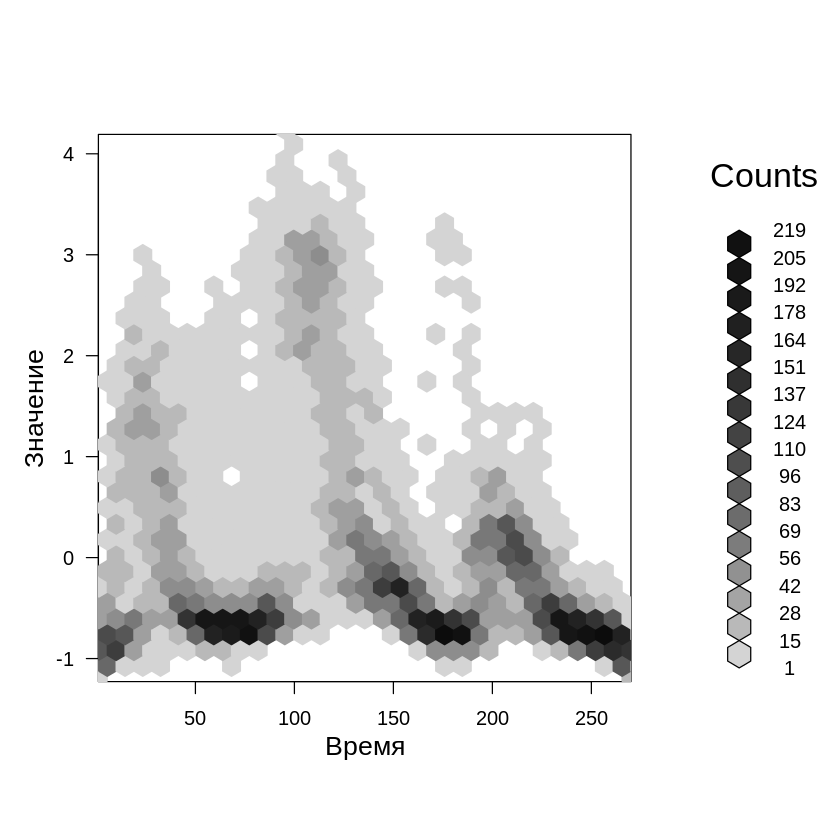

In [17]:
## R
wl = words[V1 == 1]
## Представление данных в виде пар координат в соответствии
## с требованиями функций построения двумерных гистограмм
names(wl) = c("type", 1:270)  # Исправлено с "с" на "c"
wl = melt(wl, id.vars = "type")
wl = wl[, -1]
names(wl) = c("Время", "Значение")
plot(hexbin(wl))

*Рис. 2.25. Альтернативная двумерная гистограмма для таких же исходных данных*

2.6.3 Трехмерная визуализация

Инструменты трехмерной визуализации данных не включены в стандартную библиотеку языка R, но содержатся в специальных программных пакетах. Представленные далее быстрые графики созданы с помощью пакета plotly, который выбран мною из-за возможности вращения в среде RStudio и экспортирования во всевозможные веб-интерфейсы. Кроме того, загрузка и установка пакета plotly обычно не вызывают особых затруднений, чего нельзя сказать о большинстве пакетов визуализации.

Как и ранее, воспользуемся данными пакета AirPassengers. Отобразим их в трех измерениях, два из которых отводятся для данных времени (месяц и год), а еще одно — для исследуемых значений.

In [18]:
install.packages("plotly")

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependencies ‘lazyeval’, ‘crosstalk’




In [19]:
#Код работает в RGui

library(plotly)
library(data.table)

months = 1:12
ap = as.data.table(matrix(AirPassengers, nrow = 12, ncol = 12))
names(ap) = as.character(1949:1960)
ap[, month := months]
ap = melt(ap, id.vars = 'month')
names(ap) = c("month", "year", "count")

p = plot_ly(ap, x = ~month, y = ~year, z = ~count,
             color = ~as.factor(month)) %>%
  add_markers() %>%
  layout(scene = list(xaxis = list(title = 'Месяц'),
                       yaxis = list(title = 'Год'),
                       zaxis = list(title = 'AirPassenger')))

p

Loading required package: ggplot2


Attaching package: ‘plotly’


The following object is masked from ‘package:ggplot2’:

    last_plot


The following object is masked from ‘package:stats’:

    filter


The following object is masked from ‘package:graphics’:

    layout


Warning message in RColorBrewer::brewer.pal(max(N, 3L), "Set2"):
“n too large, allowed maximum for palette Set2 is 8
Returning the palette you asked for with that many colors
”
Warning message in RColorBrewer::brewer.pal(max(N, 3L), "Set2"):
“n too large, allowed maximum for palette Set2 is 8
Returning the palette you asked for with that many colors
”
Warning message in RColorBrewer::brewer.pal(max(N, 3L), "Set2"):
“n too large, allowed maximum for palette Set2 is 8
Returning the palette you asked for with that many colors
”
Warning message in RColorBrewer::brewer.pal(max(N, 3L), "Set2"):
“n too large, allowed maximum for palette Set2 is 8
Returning the palette you asked for with that many colors
”


HTML widgets cannot be represented in plain text (need html)

Полученная в трехмерном виде диаграмма помогает лучше понять общую структуру данных. Вам уже доводилось видеть подобную диаграмму рассеяния, но расширение до трех измерений делает ее более информативной, чем двумерная гистограмма, основанная на неполном наборе данных  (рис 2.26, 2.27).

![](https://drive.google.com/uc?id=19f0r1tgrXJT99BJiJKktnLvdw0j02wWj)

*Рис. 2.26. Трехмерная диаграмма рассеяния, основанная на данных набора AirPassanger, демонстрирует ярко выраженный сезонный характер*

![](https://drive.google.com/uc?id=19gyyewlj2Bp-69D6eKJ-ab5tw0P0ne8j)

*Рис. 2.27. Представление этих же данных с другого ракурса позволяет убедиться в существовании возрастающего тренда от одного года к другому.*



Совсем не обязательно откладывать значения времени сразу на двух осях. Например, их можно указывать только на одной оси, а две другие использовать для позиционирования (установки двумерных координат). Таким способом можно визуализировать двумерное случайное блуждание, лишь немного изменив исходный код примера демонстрации возможностей пакета plotly.

In [20]:
#data = fread("E:/_3d-line-plot.csv")

#Код работает в RGui
library(plotly)
library(data.table)

words <- fread("https://drive.google.com/uc?id=1_Z4TYc5eA6ZcPuKa1bKcf1ShsdxwePb3")

p <- plot_ly(words, x = ~x1, y = ~y1, z = ~z1, type = 'scatter3d', mode = 'lines', line = list(color = '#1f77b4', width = 1))
p

HTML widgets cannot be represented in plain text (need html)

![](https://drive.google.com/uc?id=1_Yq2VNxXvc1HJsjJqvUJXYVSZjNy_cpJ)


*Pиc. 2.28. Одна из возможных точек зрения на двумерное блуждание во времени*

![](https://drive.google.com/uc?id=1Suy3P4inU5JKvnc3M31DpiZ_GAXsbwaD)


*Рис. 2.29. Еще одна точка зрения на такое же случайное блуждание оказывается более информативной.*

Интерактивный характер диаграммы является ключевым фактором в анализе данных. Отдельные перспективы могут как вводить в заблуждение, так и освещать данные в выгодном свете. Зачастую истинный характер данных остается неизведанным до поворота диаграммы.

Хорошим упражнением будет генерирование зашумленных данных о сезонных перемещениях в двух измерениях и последующая их визуализация таким же способом, как при случайном блуждании. Следует ожидать существенных различий между полученным результатом и визуализацией случайного блуждания. Такие пакеты, как plotly, позволяют легко экспериментировать с представлением данных и получать всестороннюю визуальную обратную связь.



***Дополнительные источники***

* Ложные корреляции

Ai Deng, (<А Primer on Spurious Statistical Significance in Time Series Regressions,”Economics Committee Newsletter 14, no. 1 (2015), https: / /perma. cc/9CQR-RWHC

Эта техническая статья, описывающая ложные корреляции и причины их появления в данных, станет полезной для выработки навыков практического понимания того, когда и при каких условиях проблемы подобного рода будут возникать в собственных наборах данных. Статья написана на очень доступном языке.

Tyler Vigen, Spurious Correlations (New York: Hachette, 2015), https: / /perma. cc/YY6R-SKWA

Коллекция временных рядов с разными корреляциями является важным источником информации для каждого специалиста по анализу данных.

Antonio Noriega and Daniel Ventosa-Santaularia, “Spurious Regression Under Broken-Trend Stationarity,” Journal of Time Series Analysis 27, no. 5 (2006): 671- 84,  https://perma.cc/V993-SF4F

Авторы рассматривают как теоретические аспекты, так и результаты моделирования, чтобы показать, что сдвиги уровня или тренда независимо сгенерированных наборов случайных данных проявляются в виде ложных корреляций.

C.W.J. Granger and Р. Newbold, “Spurious Regressions in Econometrics,” Journal of Econometrics 2, no. 2 (1974): 111-20, https://perma.cc/M8TE-AL6U

Эта статья по эконометрике удостоена Нобелевской премии за описание изначальных трудностей выявления ложных корреляций и обоснование надежного способа определения взаимосвязей во временных рядах.

* Исследовательские методы анализа данных

David R. Brillinger and Mark A. Finney, “An Exploratory Data Analysis of the Temperature Fluctuations in a Spreading Fire,” Environmetrics 25, no. 6 (2014): 443-53, https: / /perma. cc/QB3D-APKM

Яркий пример анализа одних и тех же лабораторных данных, имеющих географическую и временную привязку, всевозможными научными и правительственными организациями.

Robert Н. Shumway and David S. Stoffer, “Time Series Regression and Exploratory Data Analysis,” in Time Series Analysis and Its Applications with R Examples (New York: Springer, 2011), https://perma.cc/UC5B-TPVS

Глава, посвященная исследовательским методам анализа данных, из канонического труда по анализу временных рядов для аспирантов.

* Визуализация данных

Christian Tominski and Wolfgang Aigner, “The TimeViz Browser,” https://perma.cc/94ND-6ZA5

Потрясающий каталог примеров (и исходного кода) визуализации самых разных временных рядов, освещенных как в научных публикациях, так и в отраслевых работах.

Oscar Perpinan Lamigueiro, “GitHub Repository for Displaying Time Series, Spatial, and Space-time Data with R,” https: / /perma. cc/R69Y-5 JPL

Содержит примеры реализации на языке R задач визуализации временных рядов, в том числе наборов геопространственных данных.

Myles Harrison, “5 Ways to Do 2D Histograms in R,” R-bloggers, September 1, 2014, https://perma.cc/ZCX9-FQQY

Практическое руководство по многочисленным инструментам пакетов языка R построения и цветового форматирования двумерных гистограмм. Наряду со стандартными средствами в нем детально описывается пакет tidyquant, применяемый для визуализации данных фондового рынка — очень важного источника временных рядов.

* Тренды

Halbert White and Clive W.J. Granger, “Considerations of Trends in Time Series,” Journal of Time Series Econometrics 3, no. 1 (2011), https: / /perma. cc/WF2H-TVTL

Относительно недавняя научная статья, показывающая, что, хотя тренды часто встречаются в данных, даже традиционная статистика не имеет четкого набора определений для их описания. В доступном стиле авторы приводят статистическую информацию о присутствующих в нестационарных данных трендах и рекомендации по улучшению статистических методов их обработки.
